In [ ]:
import os
import pickle
from tqdm.notebook import tqdm

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, Dropout, add



In [ ]:
from tensorflow.keras.applications.vgg19 import VGG19

In [ ]:
!pip install opendatasets
!pip install pandas

In [ ]:
import opendatasets as od
import pandas


In [ ]:
od.download("https://www.kaggle.com/datasets/sakifhussain/banglalekha-image-dataset")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: sayemaamin200041234
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/sakifhussain/banglalekha-image-dataset


100%|██████████| 6.30G/6.30G [01:29<00:00, 75.7MB/s]


In [ ]:
od.download("https://www.kaggle.com/datasets/adityajn105/flickr8k/data")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: sayemaamin200041234
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/adityajn105/flickr8k


100%|██████████| 1.04G/1.04G [00:15<00:00, 73.3MB/s]


In [ ]:
BASE_DIR = '/content/banglalekha-image-dataset'
BASE_DIR2 = '/content/flickr8k'


In [ ]:
# image_path = "/content/banglalekha-image-dataset/images"
# data = pd.read_csv("/content/capcopy.csv")
# jpgs = os.listdir(image_path)
# print("Total Images in Dataset = {}".format(len(jpgs)))
# print(type(data))
# data

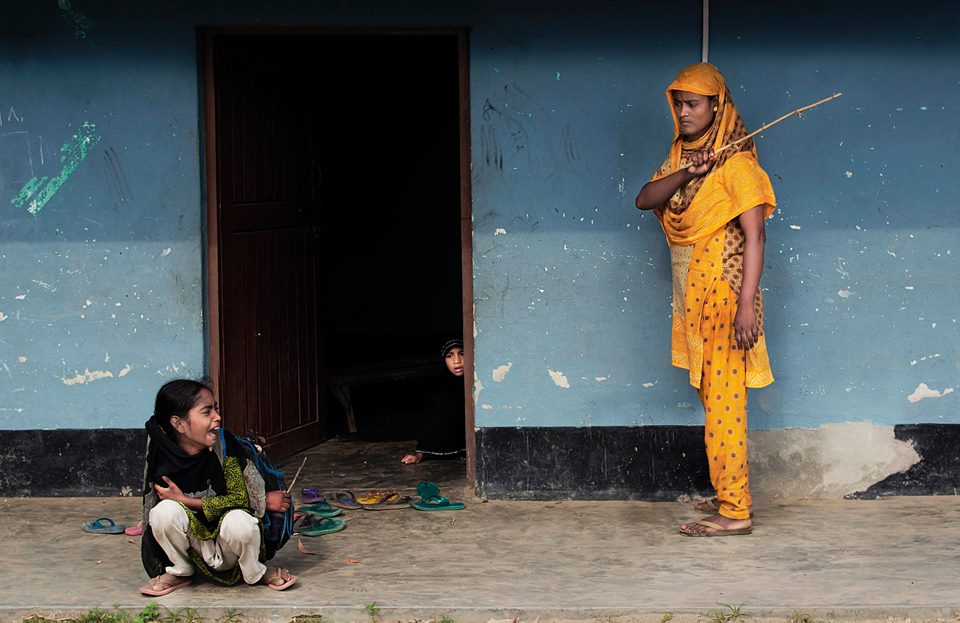

In [ ]:
from IPython.display import Image
Image('/content/banglalekha-image-dataset/images/1.png')


In [ ]:
# load vgg16 model
model = VGG19()
# restructure the model
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)
# summarize
print(model.summary())


574710816/574710816 [==============================] - 7s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

In [ ]:
# extract features from image
features = {}
directory = os.path.join(BASE_DIR2, 'Images')

for img_name in tqdm(os.listdir(directory)):
    #load the image from file
    img_path = directory + '/' + img_name
    image = load_img(img_path, target_size = (224, 224))
    # convert img pixels to numpy array
    image = img_to_array(image)
    # reshape data for model
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    # preprocess image for vgg
    feature = model.predict(image, verbose = 0)
    # get image id
    image_id = img_name.split('.')[0]
    # store feature
    features[image_id] = feature

  0%|          | 0/8091 [00:00<?, ?it/s]

In [ ]:
directory1 = os.path.join(BASE_DIR, 'images')

for img_name in tqdm(os.listdir(directory1)):
    #load the image from file
    img_path = directory1 + '/' + img_name
    image = load_img(img_path, target_size = (224, 224))
    # convert img pixels to numpy array
    image = img_to_array(image)
    # reshape data for model
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    # preprocess image for vgg
    feature = model.predict(image, verbose = 0)
    # get image id
    image_id = img_name.split('.')[0]
    # store feature
    features[image_id] = feature

In [ ]:
# WORKING_DIR = '/content/working'
# # store features in pickle
# pickle.dump(features, open(os.path.join(WORKING_DIR, 'features.pkl'), 'wb'))

In [ ]:
# load features from pickle
# with open(os.path.join(WORKING_DIR, 'features.pkl'), 'rb') as f:
#     features = pickle.load(f)

In [ ]:
import os
CAPTIONS_DIR = '/content'
with open(os.path.join(CAPTIONS_DIR, 'bangla.csv'), 'r') as f:
    next(f)
    captions_doc = f.read()

In [ ]:
captions_doc

In [ ]:
mapping = {}
#process lines
for line in tqdm(captions_doc.split('\n')):
    tokens = line.split(',')
    image_id = tokens[0]
    if len(line) < 2:
        continue
    caption =  tokens[1:]
    #remove extensions from image ID
    image_id = image_id.split('.')[0].strip()
    # convert caption list to string
    caption = " ".join(caption)
    # create list if needed
    if image_id not in mapping:
        mapping[image_id] = []
    #store the caption
    mapping[image_id].append(caption.strip())

for key in mapping:
    print(mapping[key])


In [ ]:
print(mapping)

In [ ]:
len(mapping)

In [ ]:
def clean(mapping):
    for key, captions in mapping.items():
        for i in range(len(captions)):
            #take one caption at a time
            caption = captions[i]
            # preprocessing steps
            # caption = caption.lower()
            # replace digits, special characters
            caption = caption.replace('[^\u0980-\u09FF]', '')
            #delete additional spaces
            caption = caption.replace('\s+', ' ')
            # add start and end tags to the caption
            caption = 'startseq ' + " ".join([word for word in caption.split() if len(word)>0]) + ' endseq'
            captions[i] = caption

In [ ]:
 mapping['1000268201_693b08cb0e']

In [ ]:
 mapping['1']

In [ ]:
# preprocess the text
clean(mapping)

In [ ]:
for key in mapping:
    print(mapping[key])

In [ ]:
 #after preprocess of text
 mapping['1000268201_693b08cb0e']

In [ ]:
mapping['1']

In [ ]:
all_captions = []
for key in mapping:
    for caption in mapping[key]:
        all_captions.append(caption)

In [ ]:
len(all_captions)

In [ ]:
all_captions[:10]

In [ ]:
# tokenize the text
tokenizer = Tokenizer()
tokenizer.fit_on_texts(all_captions)
vocab_size = len(tokenizer.word_index) + 1

In [ ]:
vocab_size

In [ ]:
# get maximum lenth of the caption
max_length = max(len(caption.split()) for caption in all_captions)
max_length

In [ ]:
image_ids = list(mapping.keys())
split = int(len(image_ids) * 0.90)
split
train = image_ids[:split]
test = image_ids[split:]

In [ ]:
# create data generator to get data in batch (avoid session crash)
def data_generator(data_keys, mapping, features, tokenizer, max_length, vocab_size, batch_size):
    # loop over images
    X1,X2,y = list(), list(), list()
    n = 0
    while 1:
        for key in data_keys:
            n +=1
            captions = mapping[key]
            #process each caption
            for caption in captions:
                #encode the sequence
                seq = tokenizer.texts_to_sequences([caption])[0]
                # split the sequence into X,y pairs
                for i in range(1, len(seq)):
                    # split into input and output pairs
                    in_seq,out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen= max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq], num_classes = vocab_size)[0]

                    # store the sequences
                    X1.append(features[key][0])
                    X2.append(in_seq)
                    y.append(out_seq)
            if n==batch_size:
                X1, X2, y = np.array(X1), np.array(X2), np.array(y)
                yield [X1, X2], y
                X1, X2, y = list(), list(), list()
                n = 0


In [ ]:
# image feature layers
inputs1 = Input(shape = (4096,))
fe1 = Dropout(0.4)(inputs1)
fe2 = Dense(256, activation = 'relu')(fe1)
# sequence feature layers
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, 256, mask_zero = True)(inputs2)
se2 = Dropout(0.4)(se1)
se3 = LSTM(256)(se2)

# decoder model
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation = 'relu')(decoder1)
outputs = Dense(vocab_size, activation = 'softmax')(decoder2)

model = Model(inputs= [inputs1, inputs2], outputs= outputs)
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam')

#plot the model
plot_model(model, show_shapes= True)

In [ ]:
# train the model
epochs = 20
batch_size = 32
steps = len(train) // batch_size

for i in range(epochs):
    # create data generator
    generator = data_generator(train, mapping, features, tokenizer, max_length, vocab_size, batch_size)
    # fit for one epoch
    model.fit(generator, epochs=1, steps_per_epoch = steps, verbose = 1)

In [ ]:
# save the model
# model.save(WORKING_DIR+'/best_model.h5')

In [ ]:
def idx_to_word(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None


In [ ]:
# generate caption for an image
def predict_caption(model, image, tokenizer, max_length):
    in_text = 'startseq'
    # iterate over the max length of sequence
    for i in range(max_length):
        # encode input sequence
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        # pad the sequence
        sequence = pad_sequences([sequence], max_length)
        # predict next word
        yhat = model.predict([image, sequence], verbose = 0)
        # get index with high probability
        yhat = np.argmax(yhat)
        # convert index to word
        word = idx_to_word(yhat, tokenizer)
        # stop if word not found
        if word is None:
            break
        #append word as input for generating next word
        in_text += " "+word
        # stop if we reach end tag
        if word == 'endseq':
            break
    return in_text

In [ ]:
from nltk.translate.bleu_score import corpus_bleu

# validate with text data
actual, predicted = list(), list()
for key in tqdm(test):
    # get actual caption
    captions = mapping[key]
    # predict the caption for image
    y_pred = predict_caption(model, features[key], tokenizer, max_length)
    # split into words
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    # append to the list
    actual.append(actual_captions)
    predicted.append(y_pred)

# Calculate BLEU score
print("BLEU-1: %f" %corpus_bleu(actual, predicted, weights= (1.0, 0, 0, 0)))
print("BLEU-2: %f" %corpus_bleu(actual, predicted, weights= (0.5, 0.5, 0, 0)))


  0%|          | 0/1725 [00:00<?, ?it/s]

BLEU-1: 0.437507
BLEU-2: 0.254737


In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
def generate_caption(image_name):
    # image_name = "1001773457_577c3a7d70.jpg"
    image_id = image_name.split('.')[0]
    img_path = os.path.join(BASE_DIR2, "Images", image_name)
    image = Image.open(img_path)
    captions = mapping[image_id]
    print('---------------------------Actual--------------------------')
    for caption in captions:
        print(caption)
    y_pred = predict_caption(model, features[image_id], tokenizer, max_length)
    print('--------------------------Predicted------------------------')
    print(y_pred)
    plt.imshow(image)

---------------------------Actual--------------------------
startseq একটি কালো কুকুর এবং একটি ছোপওয়ালা কুকুর ঝগড়া করছে endseq
startseq একটি কালো কুকুর একটি তিন রঙা কুকুরের সাথে রাস্তায় খেলছে endseq
startseq একটি কালো কুকুর ও একটি সাদা-বাদামি ছোপযুক্ত কুকুর রাস্তায় একে অপরের দিকে তাকিয়ে আছে endseq
startseq ভিন্ন জাতের দুটি কুকুর রাস্তায় একে অপরের দিকে তাকিয়ে আছে endseq
startseq রাস্তার পাশে দুইটি কুকুর পরস্পরের দিকে এগিয়ে যাচ্ছ endseq
--------------------------Predicted------------------------
startseq একটি কুকুর একটি বল ধরতে বাতাসে লাফ দিলো endseq


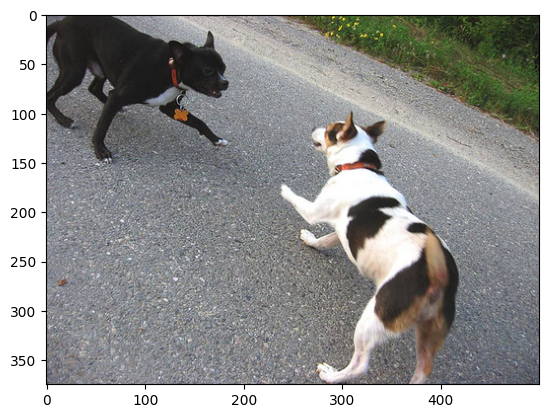

In [ ]:
generate_caption("1001773457_577c3a7d70.jpg")

---------------------------Actual--------------------------
startseq একজন পুরুষ টেবিলের উপর শুয়ে আছে যখন তার কুকুর তার পাশে বসে আছে endseq
startseq একজন মানুষ একটি বেঞ্চিতে শুয়ে আছে যার সাথে একটি সাদা কুকুরও বাধা আছে endseq
startseq একজন ব্যক্তি বাইরে বেঞ্চে ঘুমাচ্ছে এবং একটি সাদা কালো কুকুর তার পাশে বসে আছে endseq
startseq একজন নগ্নদেহী লোক তার পোষা কুকুরকে সাথে নিয়ে বাগানে একটি লম্বা আসনে শুয়ে আছে endseq
startseq মাটিতে বসে থাকা কুকুরটির শিকল ধরে বেঞ্চে শুয়ে আছে লোকটি endseq
--------------------------Predicted------------------------
startseq একটি কুকুর একটি বল পিটে খেলছে endseq


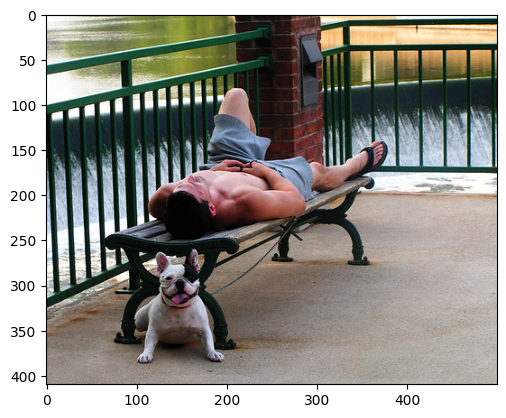

In [ ]:
generate_caption("1003163366_44323f5815.jpg")


---------------------------Actual--------------------------
startseq কমলা টুপি পরিহিত একজন পুরুষ কোনোকিছুর দিকে তাকিয়ে আছে endseq
startseq একজন মানুষ কমলা রঙের টুপি পরেছ এবং চশমাও পরেছে endseq
startseq চশমাযুক্ত একজন ব্যক্তি একটি ব্লিটজ টুপি পরেছেন endseq
startseq চশমা পরিহিত একজন ব্যক্তি বিয়ারের কৌটা দিয়ে বানানো টুপি পরে আছে endseq
startseq কান ফোঁড়ানো ব্যক্তিটি চশমা এবং কমলা টুপি পরেছে endseq
--------------------------Predicted------------------------
startseq একটি শিশু বসে আছে। endseq


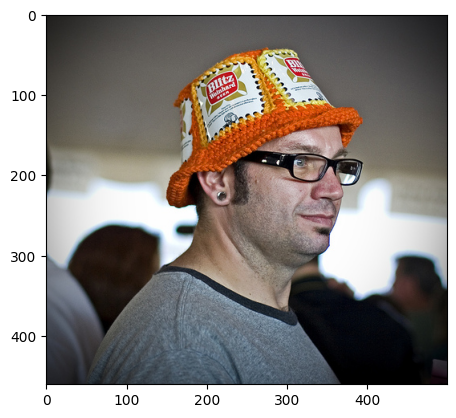

In [ ]:
generate_caption("1007129816_e794419615.jpg")


---------------------------Actual--------------------------
startseq একটি গোলাপী জামা পরা বাচ্চা মেয়ে একটি বাড়ির প্রবেশ পথের সিঁড়ি বেয়ে উঠছে endseq
startseq একটি মেয়ে শিশু একটি কাঠের বাড়িতে ঢুকছে endseq
startseq একটি বাচ্চা তার কাঠের খেলাঘরে উঠছে endseq
startseq ছোট মেয়েটি তার খেলার ঘরের সিড়ি বেয়ে উঠছে endseq
startseq গোলাপি জামা পড়া ছোট একটি মেয়ে একটি কাঠের তৈরি ঘরে প্রবেশ করছে endseq
--------------------------Predicted------------------------
startseq একটি শিশু বসে আছে। endseq


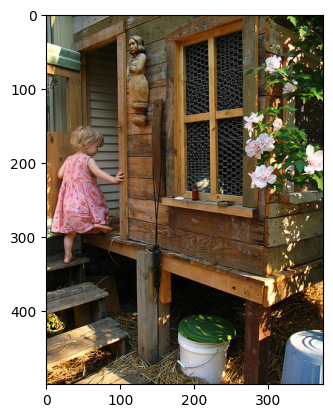

In [ ]:
generate_caption("1000268201_693b08cb0e.jpg")


---------------------------Actual--------------------------
startseq সাদা বেড়ি যুক্ত ঘাসে আবৃত একটি বাগানে একটি সাদা-কালো কুকুর দৌড়াচ্ছে endseq
startseq একটি সাদাকালো রঙের কুকুর ঘাসের উপর দৌড়াচ্ছে endseq
startseq ঘাসের উপর একটি বোস্টন টেরিয়ার কুকুর দৌড়াচ্ছে endseq
startseq একটি বোস্টন টেরিয়ার জাতের কুকুর সাদা বেড়ার সামনে দিয়ে ঘন সবুজ ঘাসের মধ্যে দৌড়ে যাচ্ছে endseq
startseq কাঠের বেড়ার পাশে কুকুরটি সবুজ ঘাসের উপর দৌড়াচ্ছে endseq
--------------------------Predicted------------------------
startseq একটি বাদামী কুকুর একটি মাঠে দৌড়াচ্ছে endseq


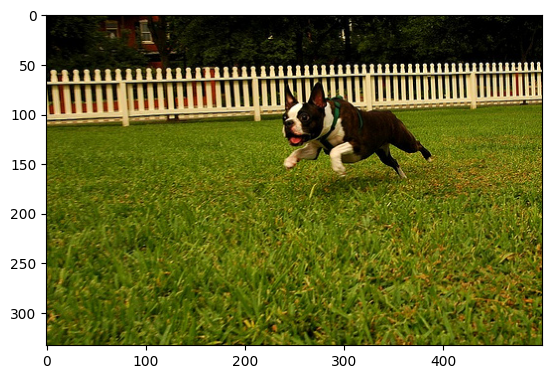

In [ ]:
generate_caption("1009434119_febe49276a.jpg")


---------------------------Actual--------------------------
startseq একটি শহরের একটি পাথর নির্মিত দেয়ালের সামনে একটি বালক হাসছে endseq
startseq একটি ছোট ছেলে রাস্তায় দাড়িয়ে আছে অ্যদিকে একজন লোক সবর্পরি কাজ করছে পাথরের দেওয়ালের উপর endseq
startseq একটি ছোট ছেলে রাস্তা দিয়ে দৌড়াচ্ছে endseq
startseq একটি ছোট শিশু পাথুরে রাস্তা ধরে হেঁটে যাচ্ছে এবং তার পেছনে একটি ধাতব খাম্বা এবং একজন ব্যক্তি রয়েছ endseq
startseq সাদা শার্ট আর নীল জিন্স পড়া হাস্যোজ্জ্বল ছেলেটি সম্পূর্ণ উল্টোদিকে মুখ করে থাকা লোকটির সাথে পাথুরে প্রাচীরের সামনে দাঁড়িয়ে আছে endseq
--------------------------Predicted------------------------
startseq একজন পুরুষ বসে আছে। endseq


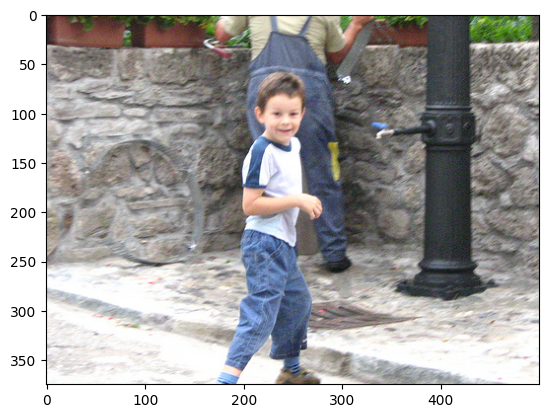

In [ ]:
generate_caption("1015118661_980735411b.jpg")


---------------------------Actual--------------------------
startseq একজন টুপি পরিহিত লোক আরেকজন নীল টুপি পরিহিত স্কিচালক কে কিছু ছবি দেখাচ্ছেন endseq
startseq একজন লোক স্কি করে যাচ্ছে আর অন্যজন চিত্র প্রদর্শন করছে বরফের উপর endseq
startseq স্কি পরিহিত একজন ব্যক্তি তুষারে রাখা ফ্রেমবন্দি ছবিগুলো দেখছে endseq
startseq একজন স্কিচালক গাছের পাশের বরফে ফ্রেমযুক্ত ছবি দেখছে endseq
startseq স্কি করতে থাকা লোকটি বরফে পড়ে থাকা বিক্রয়যোগ্য চিত্রকর্মগুলোর দিকে তাকিয়ে আছে endseq
--------------------------Predicted------------------------
startseq কয়েকজন মানুষ দেখা যাচ্ছে। endseq


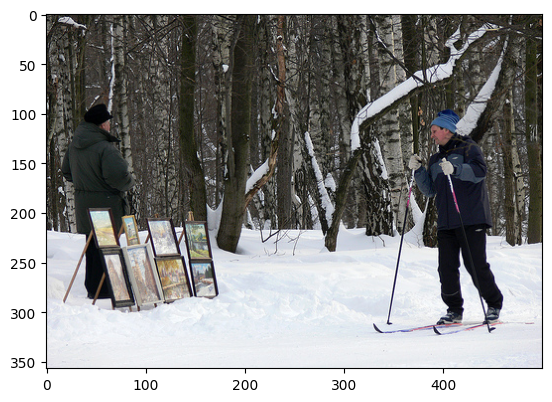

In [ ]:
generate_caption("101669240_b2d3e7f17b.jpg")


---------------------------Actual--------------------------
startseq একটি বড় শহরে একজন মহিলা এবং একটি শিশু পানির কিনারায় দাঁড়িয়ে আছে endseq
startseq একটি বড় হ্রদের কিনারায় কিছু মানুষ বসে আছে আর একটি একা হাঁস হ্রদে সাঁতার কাটছে endseq
startseq একটি ছোট ছেলে দীঘির তীরে দাঁড়িয়ে হাঁস দেখছে endseq
startseq সবুজ উদ্যান ঘেরা পানিতে থাকা হাঁসের দিকে একটি তরুণ হাত নাড়াচ্ছে endseq
startseq দুইজন লোক একটি হ্রদের কিনারায় জল এবং শহরের আকাশরেখার মুখোমুখি হয়ে আছে endseq
--------------------------Predicted------------------------
startseq একটি নৌকায় কয়েকজন মানুষ আছে। endseq


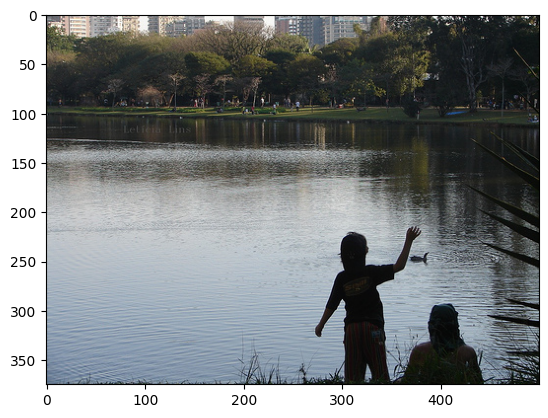

In [ ]:
generate_caption("1022454332_6af2c1449a.jpg")


---------------------------Actual--------------------------
startseq এটি একটি কালো কুকুর যা জল ছিটাচ্ছে endseq
startseq একটি কালো কুকুর পানির কিনারায় দৌড়াচ্ছে endseq
startseq একটি কালো কুকুর তার গলার বাধাবুলি নিয়ে সাগরের পানিতে খেলা করছে endseq
startseq কুকুরটি পানি ছিটাচ্ছে endseq
startseq কালো কুকুর টি পানির মধ্য দিয়ে দৌড়াচ্ছে endseq
--------------------------Predicted------------------------
startseq একটি ছেলে নদীতে গোসল করছে। endseq


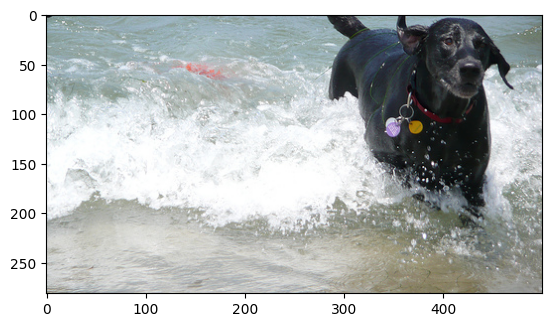

In [ ]:
generate_caption("1022975728_75515238d8.jpg")


---------------------------Actual--------------------------
startseq একজন মানুষ বরফে গর্ত খুঁড়ছে endseq
startseq একজন লোক জমে যাওয়া বরফের পুকুরে ছিদ্র করছে endseq
startseq তুষারে একটি লোক বরফে গর্ত খুঁড়ছে endseq
startseq জমাট বাঁধা দীঘির উপর একজন ব্যক্তি দাঁড়িয়ে আছেন endseq
startseq দুই জন লোক বরফে মাছ ধরছে endseq
--------------------------Predicted------------------------
startseq কয়েকজন বন্ধু একসাথে জঙ্গল দিয়ে দৌড়াচ্ছে। endseq


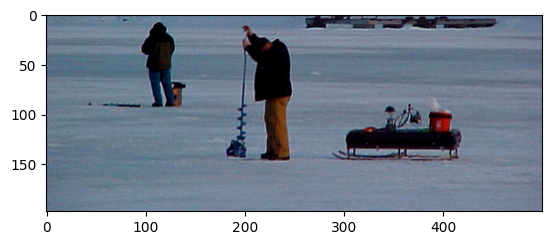

In [ ]:
generate_caption("102351840_323e3de834.jpg")


---------------------------Actual--------------------------
startseq একজন লোক ও একটি শিশু ক্যানভাসে মোড়ানো ছইওয়ালা ছোট সরু নৌকায় করে পানির উপর ভেসে বেড়াচ্ছে endseq
startseq একজন লোক এবং ছোট ছেলে নীল রঙের বহিরাবরণ পরে একটি হ্রদে ডোঙ্গা বেয়ে যাচ্ছে endseq
startseq একজন পুরুষ এবং শিশু শান্ত পানিতে কায়াকিং করছে endseq
startseq একজন পুরুষ এবং একটি বাচ্চা পানিতে নৌকা বাইছে endseq
startseq ক্যানভাস দিয়ে মোড়া ছইওয়ালা হলুদ ছোট সরু নৌকা দিয়ে একজন মানুষ এবং শিশু জলাশয়ে ঘুরে বেড়াচ্ছে endseq
--------------------------Predicted------------------------
startseq পানিতে কয়েকজন মানুষ গোছল করছে। endseq


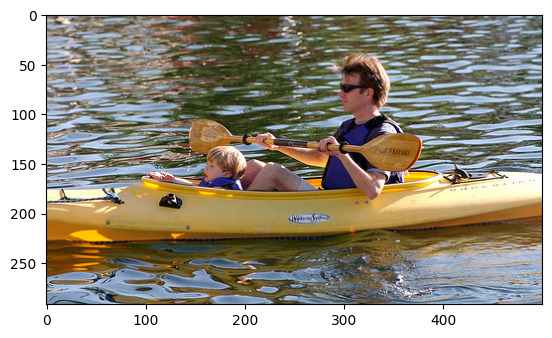

In [ ]:
generate_caption("1028205764_7e8df9a2ea.jpg")


---------------------------Actual--------------------------
startseq লাঠি হাতে একটি বালক গোল ধরার জালের সামনে হাঁটু গেঁড়ে বসে আছে endseq
startseq লাল বহিরাবরণ পরে একটি ছেলে গোলরক্ষক হিসেবে হকি খেলছে endseq
startseq একটি ছোট ছেলে হকি রিংক এ গোলরক্ষক হয়ে খেলছে endseq
startseq ডান হাতে হকি স্টিক নিয়ে হকি গোলের সামনে হাঁটু গেড়ে বসে আছে এক তরুণ endseq
startseq লাল জ্যাকেট পরা হকি গোলরক্ষক ছেলেটি নত হয়ে আছে হাতে স্টিক নিয়ে endseq
--------------------------Predicted------------------------
startseq একজন পুরুষ ও একজন নারী বসে আছে। endseq


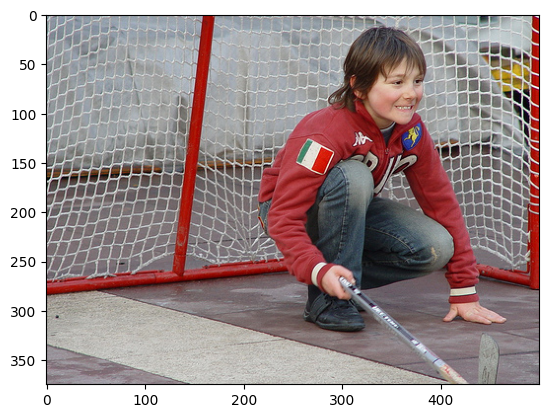

In [ ]:
generate_caption("103106960_e8a41d64f8.jpg")


---------------------------Actual--------------------------
startseq বরফের উপর একটি তাবু স্থাপন করা হচ্ছে endseq
startseq বরফে ঢাকা একটি হ্রদে দুজন লোক একটি মাছ শিকার করার তাঁবুতে প্রবেশ করছে endseq
startseq দুজন ব্যক্তি একটি হিমায়িত লেকের ওপর বরফে মাছ ধরার একটি নীল কুঁড়েঘর বসাচ্ছে endseq
startseq বরফের উপরে একটি নীল ত্রিপলের মধ্যে দুইজন লোক কিছু দেখছে endseq
startseq বরফের পৃষ্ঠতলে নীল তাঁবু কাঠামোর বাইরে দু'জন লোক দাঁড়িয়ে আছে endseq
--------------------------Predicted------------------------
startseq একটি লোক ব্রীজের উপর দাড়িয়ে আছে। endseq


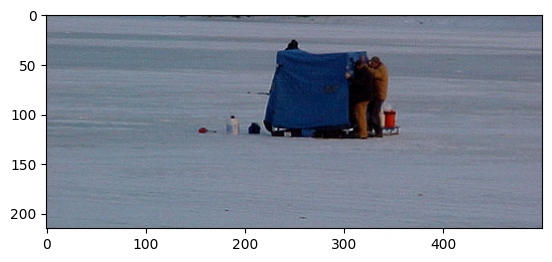

In [ ]:
generate_caption("103205630_682ca7285b.jpg")


---------------------------Actual--------------------------
startseq গগনচুম্বী ভবনের সামনে একজন লোক দাড়িয়ে আছে endseq
startseq একজন লোক একটি গগনচুম্বী দালানের সামনে দাঁড়িয়ে আছে endseq
startseq অনেক উঁচু একটি দালানের সামনে একটি লোক দাঁড়িয়ে আছে endseq
startseq লাল জামা পরিহিত লোকটির পিছনে দাঁড়িয়ে রয়েছে একটি বিশাল আকাশচুম্বি অট্টালিকা endseq
startseq অতি উচ্চ অট্টালিকাটির ছবি তুলতে চিত্রগাহকের বাঁধা হয়ে দাঁড়িয়ে আছেন লোকটি endseq
--------------------------Predicted------------------------
startseq একটি তোরণ দেখা যাচ্ছে। endseq


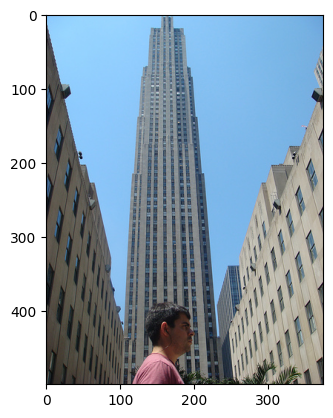

In [ ]:
generate_caption("1032460886_4a598ed535.jpg")


---------------------------Actual--------------------------
startseq সবুজ পোশাক পরিহিত একটি বালক নিচে ভাসমান নৌকাসমূহের দিকে তাকিয়ে আছে endseq
startseq সবুজ শার্ট পড়া একটি ছেলে কায়াকারদেরকে দেখছে endseq
startseq একটি ছেলে বেড়ার উপর থেকে নিচে তাকিয়ে অনেকগুলো নৌকা এবং ভেলা দেখছে endseq
startseq একটি ছোট বালক ভাসমান নৌকার জনতাকে দেখছে endseq
startseq জার্সি পরিহিত বালকটি কৌতুহল নিয়ে পানিতে ভাসমান নৌকাগুলোর দিকে তাকিয়ে আছে endseq
--------------------------Predicted------------------------
startseq অনেকগুলো শিশু গোল হয়ে বসে আছে। endseq


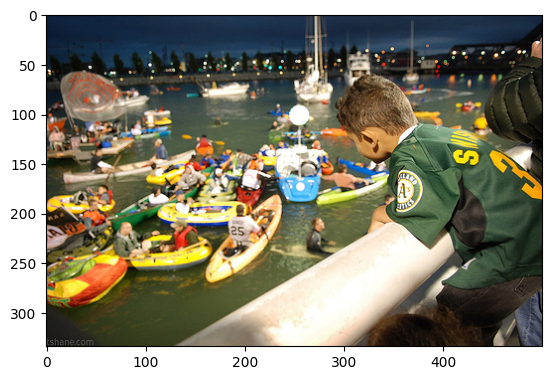

In [ ]:
generate_caption("1042020065_fb3d3ba5ba.jpg")


---------------------------Actual--------------------------
startseq একজন নারী এবং পুরুষ ছবি তুলছে এমন অবস্থায় একজন লোক পেছন থেকে তাদের দেখছে endseq
startseq কিছু দালানের সামনে একটি লোক একজন মহিলার হাত মুখের সামনে ধরে আছে এবং আরেক লোক সেদিকে তাকিয়ে আছে endseq
startseq একটি বহু-সংস্কৃত দম্পতি একটি ছবির জন্য পোজ দিচ্ছেন endseq
startseq এশিয়ান পুরুষ এবং স্বর্ণকেশী মহিলা বাইরে হাত ধরে আছে এবং পিছনের লোকটি তাদেরকে দেখছে endseq
startseq নীল শার্ট পড়া লোক কালো ডোরাকাটা জ্যাকেটের মহিলা কামরাচ্ছে যখন আরেকজন লোক দেখছে endseq
--------------------------Predicted------------------------
startseq একজন পুরুষ বসে আছে। endseq


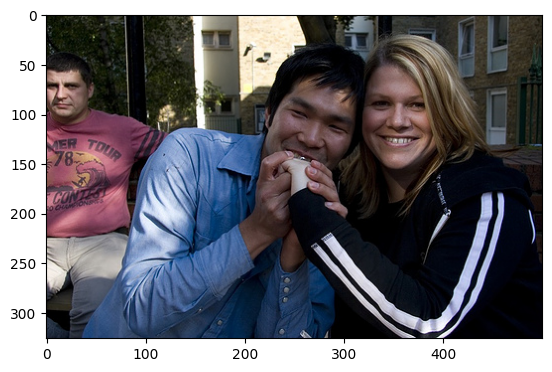

In [ ]:
generate_caption("1042590306_95dea0916c.jpg")


---------------------------Actual--------------------------
startseq চার শিশুর একটি দল ঘুমের পোশাক পরিধান করে বালিশ যুদ্ধ খেলছে endseq
startseq বাচ্চাদের দল বালিশ নিয়ে খেলছে endseq
startseq বিছানার উপর শিশুদের দল বালিশ যুদ্ধ খেলছে endseq
startseq বাচ্চারা বালিশের লড়াই খেলছে endseq
startseq চার শিশু মিলে বালিশ যুদ্ধ করছে endseq
--------------------------Predicted------------------------
startseq একজন পুরুষ বসে আছে। endseq


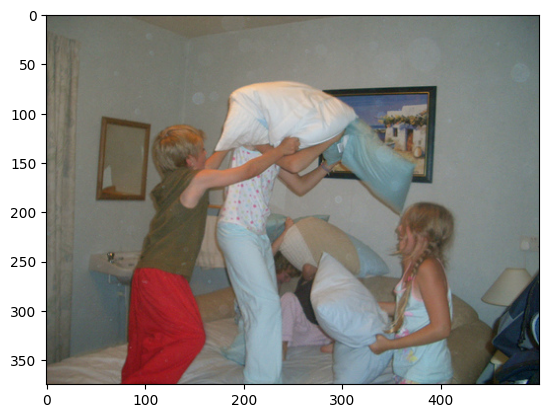

In [ ]:
generate_caption("1055623002_8195a43714.jpg")


---------------------------Actual--------------------------
startseq একজন নীল পোশাক পরিহিত সোনালী চুলের নারী তার বাহনের জন্য অপেক্ষা করছেন endseq
startseq একজন স্বর্ণকেশী মহিলা রাস্তায় একটি ট্যাক্সি থামানোর চেষ্টা করছেন endseq
startseq পেছন থেকে দেখা যাচ্ছে একজন মহিলা ট্র্যাফিক সিগন্যাল দিচ্ছে endseq
startseq একজন স্বর্ণকেশী নীল-টপ পরিহিত মহিলা রাস্তার পাশে হাত নাড়ছেন endseq
startseq নীল পোশাকের মহিলা অগ্রসরমান যানবাহনের প্রতি তার হাতটি ধরে রেখেছেন endseq
--------------------------Predicted------------------------
startseq একটি শিশু বসে আছে। endseq


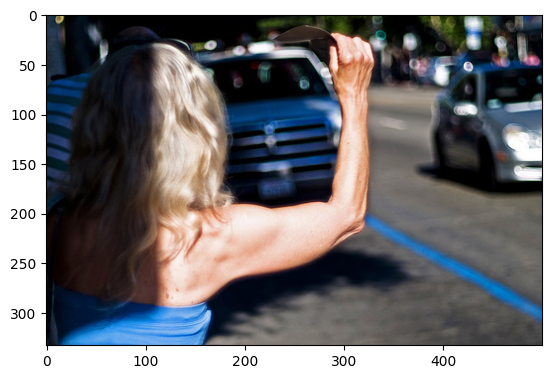

In [ ]:
generate_caption("1056338697_4f7d7ce270.jpg")


---------------------------Actual--------------------------
startseq এক লোক তার নীল ছোটো প্যান্ট পরিধান করে রাস্তায় শুয়ে আছে endseq
startseq নীল ছোটো প্যান্ট পরিহিত লোকটি বাইরে গাড়ি রাখার স্থানে শুয়ে আছে endseq
startseq ভারী যানজটের সময় রাস্তার মাঝখানে এক ব্যাক্তি শুয়ে আছে endseq
startseq বাদামী রঙের এসইউভি এবং একটি খোলা দরজা সহ একটি হলুদ পিকআপের মধ্যকার পার্কিং স্থানে একজন লোক একটি মাদুরের উপর শুয়ে আছে endseq
startseq এক অর্ধনগ্ন লোক একটি ব্যস্ত সড়কের মাঝখানে শুয়ে আছে endseq
--------------------------Predicted------------------------
startseq একটি কালো রঙ্গের ছাদ। endseq


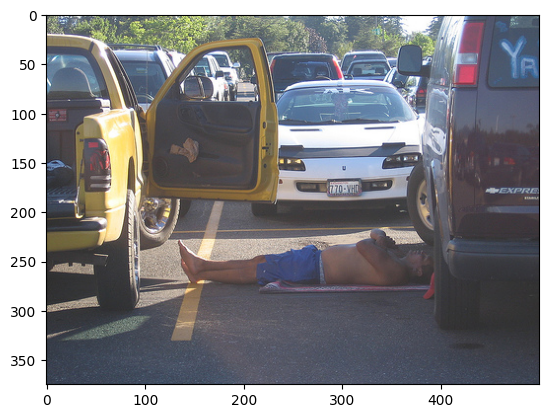

In [ ]:
generate_caption("1067675215_7336a694d6.jpg")


---------------------------Actual--------------------------
startseq একদল লোক রাতের বেলায় ফানুস দেখছে endseq
startseq রাতের আকাশে কিছু জ্বলন্ত ফানুস endseq
startseq লোকেরা পার্কে গরম হাওয়া ভর্তি বেলুনগুলি দেখছে endseq
startseq মানুষ আকাশযান দেখছে endseq
startseq রাতে জনতার কাছে সাতটি বিশাল বেলুন সারিবদ্ধভাবে রয়েছে endseq
--------------------------Predicted------------------------
startseq অনেকগুলো ছেলেমেয়ে জন পুরুষ নদীর পাড়ে দাড়িয়ে আছে এবং নদীর পানির উপর অনেকগুলো নৌকা নিয়ে হেটে যাচ্ছে কিছু মানুষ । endseq


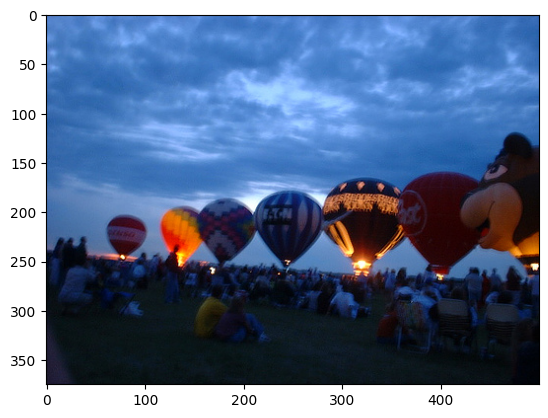

In [ ]:
generate_caption("107318069_e9f2ef32de.jpg")


---------------------------Actual--------------------------
startseq আটজন ব্যক্তির একটি দল রাতের বেলায় একটি টেবিলের চতুর্দিকে জড়ো হয়েছে endseq
startseq অন্ধকারে কিছু মানুষ জমায়েত হয়েছে endseq
startseq একদল লোক রাতে বারান্দায় বাইরে একটি টেবিলের চারপাশে বসে endseq
startseq একদল লোক রাতে বাড়ির বাইরে একসাথে বসে আছে endseq
startseq অন্ধকার ঘরে একদল লোক একটি টেবিলে বসে আছে endseq
--------------------------Predicted------------------------
startseq একটি কলেজে কালো বুটের নিচে কিছু ছোট বাচ্চা বসে আছে । endseq


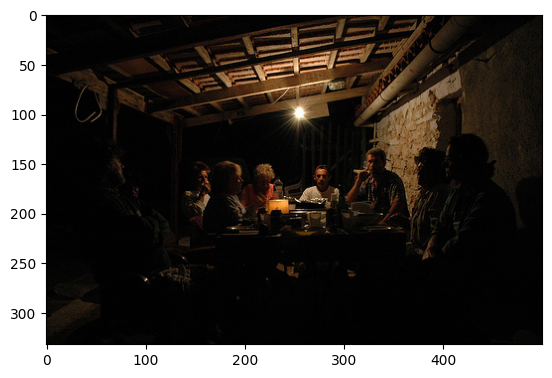

In [ ]:
generate_caption("107582366_d86f2d3347.jpg")


---------------------------Actual--------------------------
startseq সেনালী চুলের একটি ঘোড়া এবং সোনালী চুলের একটি সোয়েটার পরিহিত মেয়ে পিপেতে জ্বলন্ত আগুনের দিকে তাকিয়ে আছে endseq
startseq আগুনের কাছে মেয়েটি তার ঘোড়া নিয়ে দাঁড়িয়ে আছে endseq
startseq একটি মেয়ে আগুনের সামনে ঘোড়ার লাগাম ধরে রেখেছে endseq
startseq একজন ব্যক্তি একটি মেয়ে এবং দুইটি ঘোড়া আগুনের শিখার কাছে অবস্থান করছে endseq
startseq দু'জন লোক এবং দুটি ঘোড়া আগুন দেখছে endseq
--------------------------Predicted------------------------
startseq একটি গরু ও একটি গরু আছে। endseq


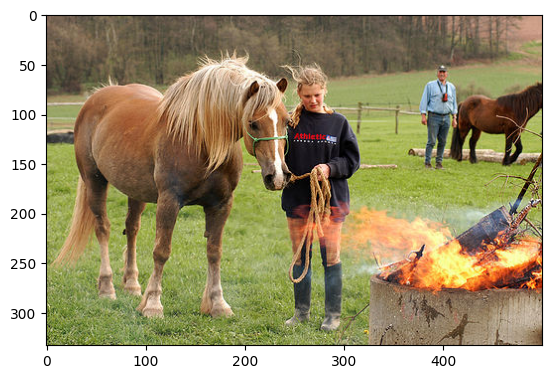

In [ ]:
generate_caption("10815824_2997e03d76.jpg")


---------------------------Actual--------------------------
startseq একটি সাদা কুকুরের কাছ থেকে ধারণকৃত চিত্র- কুকুরটি তার থাবার উপর মাথা রেখে শুয়ে আছে endseq
startseq সাদা বড় কুকুরটি মেঝেতে শুয়ে আছে endseq
startseq একটি সাদা কুকুর তার মাথা মাটিতে লাগিয়ে রয়েছে endseq
startseq একটি সাদা কুকুর চোখ খোলা রেখে টালি-ছাত্তয়া মেঝেতে মাথা নুইয়ে বিশ্রাম নিচ্ছে endseq
startseq একটি সাদা কুকুর বহিঃপ্রাঙ্গনের ইটের উপর মাথা রেখে বিশ্রাম নিচ্ছে endseq
--------------------------Predicted------------------------
startseq একটি কুকুর মুখে গাজর কামড়ে আছে endseq


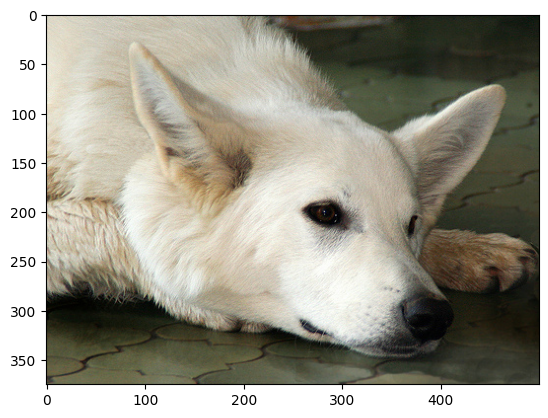

In [ ]:
generate_caption("1084040636_97d9633581.jpg")


---------------------------Actual--------------------------
startseq একটি সুন্দর দিনে একটি পরিবার হালচাষের যন্ত্রের উপর খেলছে endseq
startseq শিশুরা মাঠে হালচাষের যন্ত্র চড়ে বেড়াচ্ছে endseq
startseq বেশ কয়েকটি বাচ্চা বাইরে পোলারিস গাড়িতে খেলছে endseq
startseq চার চাকার গাড়িতে চড়ে শিশুরা খেলা করছে endseq
startseq চারটি বাচ্চা একটি মাঠে চার চাকার গাড়িতে চড়ছে endseq
--------------------------Predicted------------------------
startseq একজন পুরুষ লাফ দিয়েছে। endseq


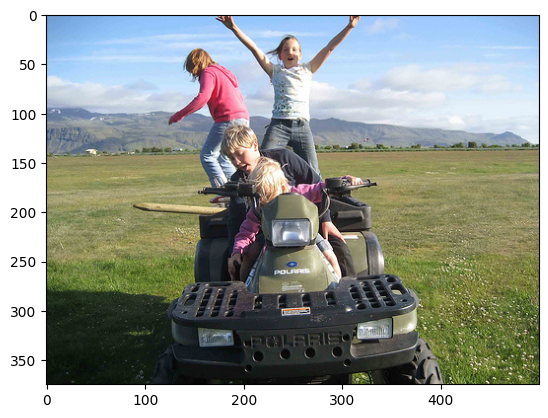

In [ ]:
generate_caption("1087539207_9f77ab3aaf.jpg")


---------------------------Actual--------------------------
startseq একাকী স্কিচালক পাহাড়ের রাস্তা বেয়ে উপরে উঠছে endseq
startseq বরফাবৃত পাহাড় চূড়ায় স্কি চালকেরা দাঁড়িয়ে আছে endseq
startseq বরফের পাহাড়ে আরোহণকারী দুজন হাইকার endseq
startseq তুষার ঢাকা পর্বতের উপর দুইজন ব্যক্তি endseq
startseq ২ জন মানুষ একটি বরফাচ্ছন্ন পর্বত আরোহণ করছেন endseq
--------------------------Predicted------------------------
startseq একটি নতুন বিল্ডিং endseq


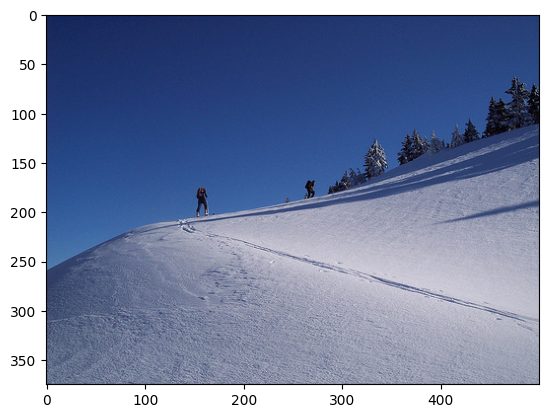

In [ ]:
generate_caption("108899015_bf36131a57.jpg")


---------------------------Actual--------------------------
startseq ডোরাকাটা জামা পরিহিত বালক ঝর্ণার সামনে লাফ দিচ্ছে endseq
startseq একটি পাথরের তৈরী ফোয়ারার সামনে একটি বালক লাফ দিয়ে উঠলো endseq
startseq একজন হাস্যজ্জল বালক শহরের ফোয়ারার সামনে লাফিয়ে খেলা করছে endseq
startseq এক ছোট বালক ফোয়ারার সামনে লাফাচ্ছে endseq
startseq একটি ছোট বালক খেলাচ্ছলে ফোয়ারার পাশে লাফাচ্ছে endseq
--------------------------Predicted------------------------
startseq একটি লোক স্টেশনের কাছে দাড়িয়ে আছে ও একজন বাশ ধরে দাড়িয়ে আছে। endseq


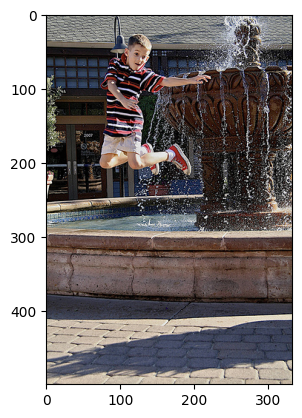

In [ ]:
generate_caption("1100214449_d10861e633.jpg")


In [ ]:
def generate_caption2(image_name):
    # image_name = "1001773457_577c3a7d70.jpg"
    image_id = image_name.split('.')[0]
    img_path = os.path.join(BASE_DIR, "images", image_name)
    image = Image.open(img_path)
    captions = mapping[image_id]
    print('---------------------------Actual--------------------------')
    for caption in captions:
        print(caption)
    y_pred = predict_caption(model, features[image_id], tokenizer, max_length)
    print('--------------------------Predicted------------------------')
    print(y_pred)
    plt.imshow(image)

---------------------------Actual--------------------------
startseq তিন জন মেয়ে মানুষ আছে। এক জন দাড়িয়ে আছে আর দুই জন বসে আছে। endseq
startseq একটি হলুদ জামা পায়জামা পরা মহিলা দাড়িয়ে হাতে একটি বেত নিয়ে পিটানোর ভাব দেখাচ্ছে আর ছোট একটি মেয়ে পিছনে ব্যাগ নিয়ে বসে কাঁদছে। endseq
--------------------------Predicted------------------------
startseq একটি শিশু সরিষা ক্ষেতের পাশ দিয়ে হেঁটে যাচ্ছে। endseq


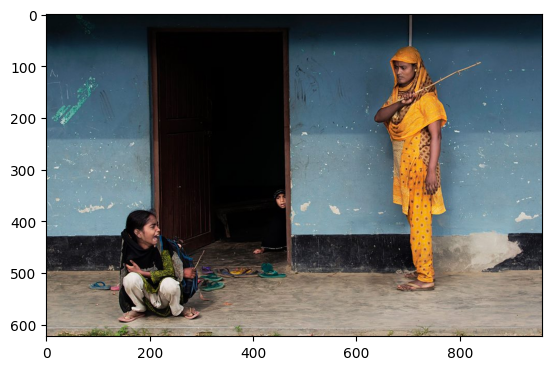

In [ ]:
generate_caption2("1.png")

---------------------------Actual--------------------------
startseq জলাশয় এ একজন ছেলে মানুষ ও একটি বাচ্চা মানুষ আছে। তাদের পিছনে সবুজ গাছ আছে। endseq
startseq ২ জন মানুষ যার একজন পুরুষ একটি নৌকায় দাড়িয়ে চালাচ্ছে সাদা লুঙ্গী ছাই রঙের গেঞ্জি পরে আরেকজন ছোট ছেলে পার থেকে ধাক্কা দিচ্ছে নউকাতিকে যার পরনে ফুল প্যান্ট খালি গা। endseq
--------------------------Predicted------------------------
startseq একটি নৌকায় কয়েকজন মানুষ আছে। endseq


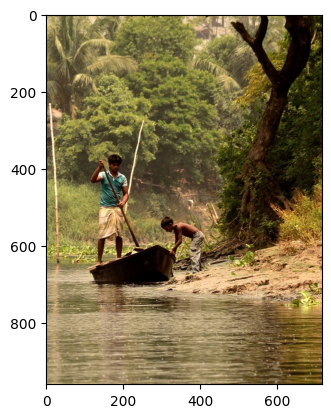

In [ ]:
generate_caption2("2.png")

---------------------------Actual--------------------------
startseq অনেক মেয়ে মানুষ বসে আছে। endseq
startseq একটি নীল জামা পরা মহিলা একটি নীল ল্যাপটপ এর দিকে তাকিয়ে আছে এবং পিছনে তার দিকে বসে শারি পরে তাকিয়ে আছে অনেকগুলো মহিলা। endseq
--------------------------Predicted------------------------
startseq অনেকগুলো শিশু গোল হয়ে বসে আছে। endseq


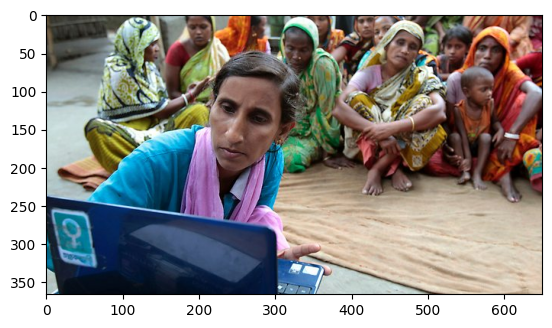

In [ ]:
generate_caption2("3.png")

---------------------------Actual--------------------------
startseq একজন ছেলে মানুষ রিক্সা নিয়ে দাঁড়িয়ে আছে ও বৃষ্টিতে ভিজছে। endseq
startseq একজন রিক্সা চালক একটি রিক্সা নিয়ে দাড়িয়ে বৃষটিতে ভিজছে তার গায়ে জাম রঙের শার্ট কালো বাদামি লুঙ্গী। endseq
--------------------------Predicted------------------------
startseq একটি স্কুল ও একটি ভবন। endseq


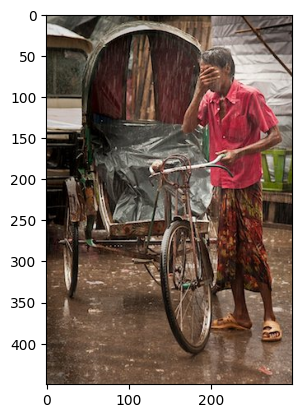

In [ ]:
generate_caption2("31.png")

---------------------------Actual--------------------------
startseq ফসলের মাঠের মধ্যে দিয়ে তিন জন মানুষ হেঁটে যাচ্ছে। endseq
startseq ৩ জন মাদ্রাসার ছাত্র হাঁটছে ২ টি সরিষাক্ষেতের মাঝ দিয়ে একটি সরু রাস্তা দিয়ে তাদের পরনে সাদা টুপি হাতে টিফিন ক্যারিয়ার এবং পাঞ্জাবী পরা ডানপাশের সরিষাক্ষেতে হলুদ ফুল ফুটে আছে। endseq
--------------------------Predicted------------------------
startseq ধান ক্ষেতে অনেকগুলো মানুষ আছে। endseq


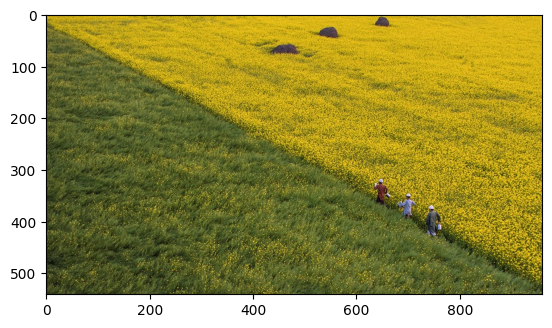

In [ ]:
generate_caption2("34.png")

---------------------------Actual--------------------------
startseq জলাশয় এর পাশে গাছ আছে। উপরে নীল আকাশে অল্প সাদা মেঘ আছে। endseq
startseq ৭ টি টাল গাছ দাড়িয়ে আছে একটি জলাশয়ের পাড়ে কিছু এলোমেলো গাছও আছে। endseq
--------------------------Predicted------------------------
startseq একটি বড় বট একটি খাল। endseq


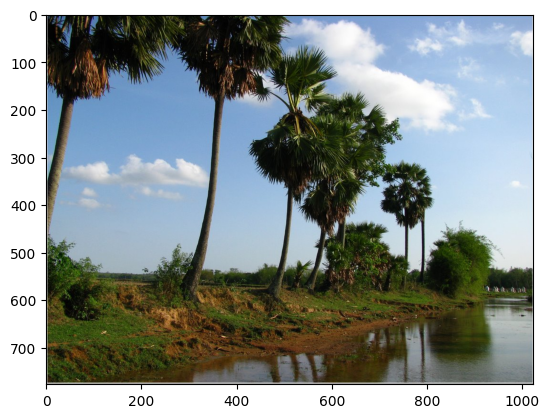

In [ ]:
generate_caption2("45.png")

---------------------------Actual--------------------------
startseq একজন মহিলা মানুষ কাজ করছে। endseq
startseq ১ জন মহিলা শারি পরে হাতে একটি বেলচা নিয়ে পাথিতে কয়লা তুলছে একটি কয়লার স্তপ থেকে তার পাশে আরও ৩ টি পাথি। endseq
--------------------------Predicted------------------------
startseq একটি ছেলে পাহাড়ের পানিতে গোসল করছে। endseq


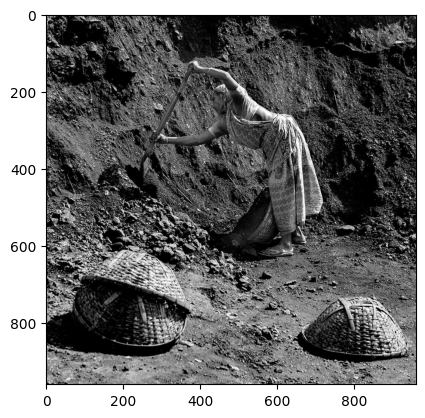

In [ ]:
generate_caption2("100.png")

---------------------------Actual--------------------------
startseq একজন পুরুষ মানুষ মাথায় ইট নিচ্ছে। endseq
startseq একজন ছেলে মানুষ মাথায় ঝুড়ি দিয়ে খুয়া তুলছে। endseq
--------------------------Predicted------------------------
startseq একটি শিশু বসে আছে। endseq


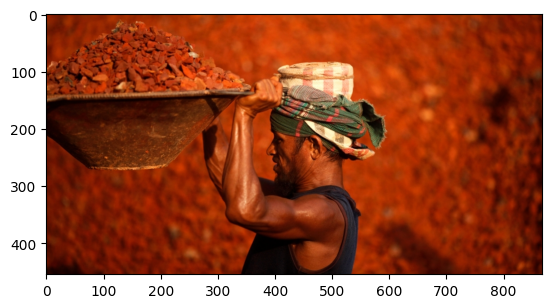

In [ ]:
generate_caption2("1000.png")

---------------------------Actual--------------------------
startseq মাটিতে আল্পনা আঁকা তার মধ্যে একটা লোক সঙ সেজে মাথায় টুপি পড়ে কাঁধে ঝুড়ি নিয়ে হেঁটে যাচ্ছে। endseq
startseq একজন মানুষ পিঠে কিছু নিয়ে রাস্তা দিয়ে হেঁটে যাচ্ছে। endseq
--------------------------Predicted------------------------
startseq একটি লোক একটি মিক্সিং জায়গায় দাড়িয়ে আছে মাঠে। endseq


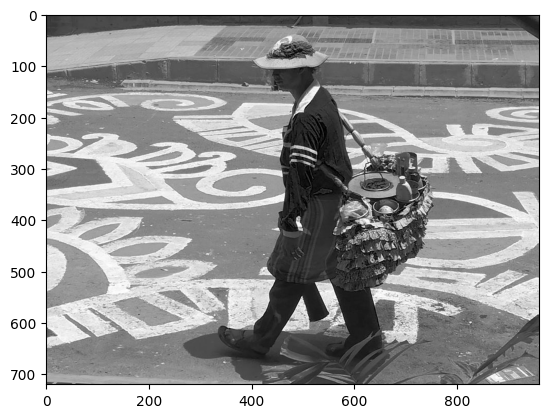

In [ ]:
generate_caption2("2001.png")

---------------------------Actual--------------------------
startseq তিনজন পুরুষ মানুষ দাড়িয়ে আছে। endseq
startseq একটি জানালার মত খোপে দারিয়ে আছে ৩ জন বালক। endseq
--------------------------Predicted------------------------
startseq একটি পুরাতন মন্দীর। endseq


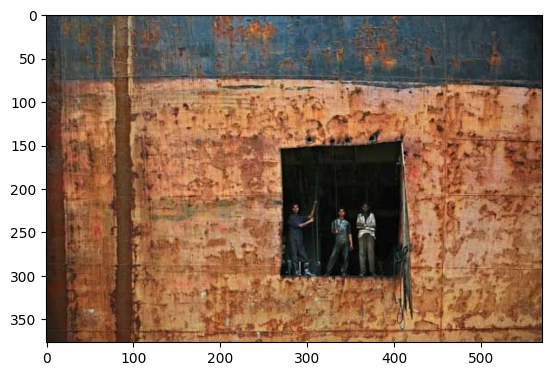

In [ ]:
generate_caption2("345.png")

---------------------------Actual--------------------------
startseq একজন নারী ও দুইটি শিশু আছে। endseq
startseq একটি মহিলার হাতের উপর একটি পাখি ও পাশে ২ টি বাচ্চা ছেলে। endseq
--------------------------Predicted------------------------
startseq কয়েকজন ছেলে মেয়ে পাহাড়ের নিচে বসে আছে পানিতে। endseq


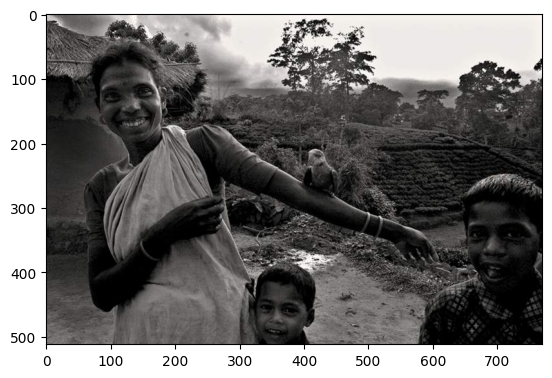

In [ ]:
generate_caption2("896.png")

---------------------------Actual--------------------------
startseq একটি শিশু যাচ্ছে। endseq
startseq কুয়াশার মাঝে একজন ছোট ছেলে গেঞ্জি হাফ প্যান্ট পরে একটি সেতুর উপর দিয়ে দৌর দিচ্ছে। endseq
--------------------------Predicted------------------------
startseq একটি রেল স্টেশনে তিনজন মানুষ আছে। endseq


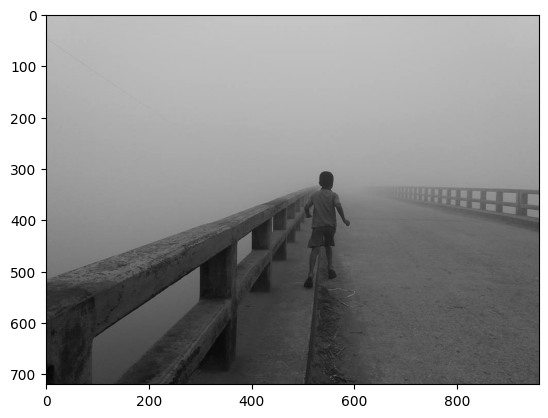

In [ ]:
generate_caption2("3214.png")

---------------------------Actual--------------------------
startseq একজন পুরুষ দাড়িয়ে আছে। endseq
startseq একজন পুরুষ একটি কারখানার মাঝে দেয়ালের উপরে দাঁড়িয়ে আছেন। endseq
--------------------------Predicted------------------------
startseq একটি পুরাতন বাড়ী। endseq


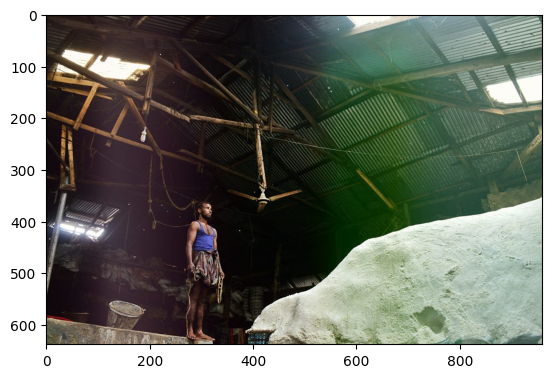

In [ ]:
generate_caption2("6789.png")

---------------------------Actual--------------------------
startseq একটি নৌকার উপর কয়েকজন মানুষ আছে। endseq
startseq কয়েকটি গরু মাটিতে ঘাস খাচ্ছে ও নদীর খাল দিয়ে নৌকা নিয়ে যাচ্ছে। endseq
--------------------------Predicted------------------------
startseq ক্ষেতে অনেকগুলো নৌকা আছে। endseq


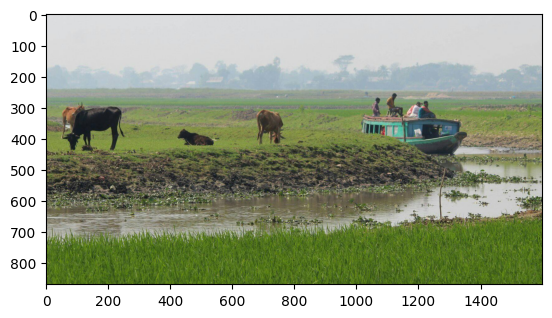

In [ ]:
generate_caption2("4590.png")

---------------------------Actual--------------------------
startseq একটি শিশু আছে। endseq
startseq একটি গাড়ির আয়না ধরে মুখ দেখছেন একজন টোকাতে বাচ্চা ছেলে। endseq
--------------------------Predicted------------------------
startseq একটি তোরণ দেখা যাচ্ছে। endseq


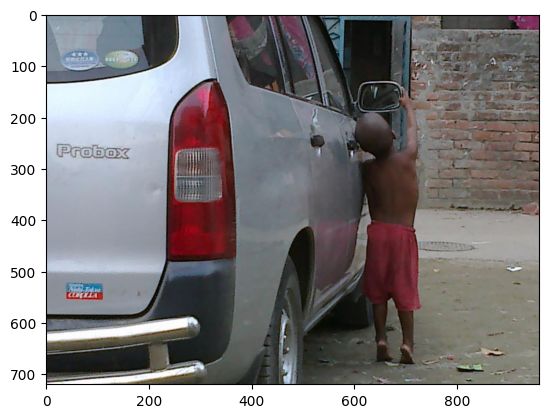

In [ ]:
generate_caption2("7324.png")

---------------------------Actual--------------------------
startseq একটি গাছ এবং একজন পুরুষ কাধে কোদাল নিয়ে হেটে যাচ্ছেন। endseq
startseq একজন মানুষ হেঁটে যাচ্ছে। endseq
--------------------------Predicted------------------------
startseq একটি নতুন বিল্ডিং করছে ও একটি বড় বট গাছ দেখা যাচ্ছে। endseq


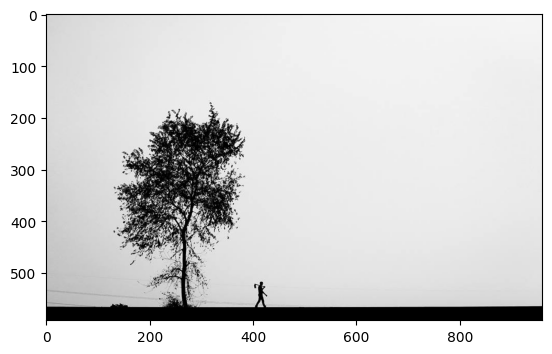

In [ ]:
generate_caption2("5699.png")

---------------------------Actual--------------------------
startseq খালি শরীরে একজন পুরুষ মাথায় ঝাঁকা নিয়ে আছে। endseq
startseq মাথায় ঝুড়ি নিয়ে একজন লোক হেঁটে যাচ্ছে আর তার পিঠ বেয়ে ঘাম ঝরছে। endseq
--------------------------Predicted------------------------
startseq একজন পুরুষ সরিষা ক্ষেতে দাড়িয়ে আছেন একটি লোক। endseq


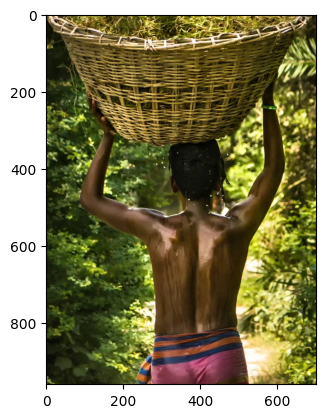

In [ ]:
generate_caption2("7991.png")